<a href="https://colab.research.google.com/github/markovicnatasa/PrincipiPrezentacijeIPrepoznavanjaOblika/blob/main/NatasaMarkovicIT46_2019_Projekat.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Student: Nataša Marković IT46/2019 Tema: Generative Adversarial Networks - GAN

***Uvod: ***

Tema ovog projekta je GAN (Generative Adversarial Network) što predstavlja vrstu neuronske mreže koja se sastoji od dve suprotstavljene mreže - generatora i diskriminatora. Ova tehnika se koristi za generisanje novih podataka koji su slični podacima iz trening skupa.

Generator je odgovoran za generisanje novih uzoraka, dok je diskriminator odgovoran za klasifikaciju između generisanih uzoraka i stvarnih uzoraka iz trening skupa. Cilj GAN-a je da generator nauči da generiše uzorke koji su što sličniji stvarnim uzorcima, dok diskriminator uči da ih što bolje razlikuje.

Za potrebe projekta, odlučila sam se da koristim specifičnu implementaciju GAN-A, a to je DCGAN (Deep Convolutional Generative Adversarial Network)koja koristi duboku konvolutivnu neuronsku mrežu. Ova arhitektura se često koristi za generisanje slika, jer je veoma efikasna u učenju lokalnih i globalnih karakteristika slika.

DCGAN koristi konvolutivne slojeve za obradu slika i dekonvolucijske slojeve za generisanje slika. Takođe, koristi tehnike kao što su batch normalization, ReLU aktivaciona funkcija i Adam optimizator kako bi poboljšao performanse u učenju i generisanju visokokvalitetnih slika.

***Proces upotrebe DCGAN-a:***

Proces treniranja DCGAN-a uključuje iterativno poboljšavanje performansi generatora i diskriminatora putem suparničkog učenja. Prvo, generator generiše uzorke na osnovu ulaznog šuma. Zatim diskriminator ocenjuje generisane uzorke i stvarne uzorke iz trening skupa. Cilj generatora je da generiše uzorke koji će prevariti diskriminator da ih klasifikuje kao stvarne, dok je cilj diskriminatora da što bolje razlikuje stvarne uzorke od generisanih.

Tokom treninga, generator i diskriminator se nadmašuju i postepeno poboljšavaju svoje performanse. Kroz više iteracija, generator postaje sve bolji u generisanju realističnih uzoraka, dok diskriminator postaje sve bolji u razlikovanju stvarnih i generisanih uzoraka.

Konačni rezultat DCGAN-a je generator koji je naučio da generiše nove slike koje su slične uzorcima iz trening skupa.

Importovanje biblioteka

In [ ]:
import torchvision
import torchvision.transforms as transforms
from torchvision import datasets

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader
import torchvision.utils as vutils
import torchvision.models as models
from scipy import linalg
from torch.nn.functional import adaptive_avg_pool2d

import matplotlib.pyplot as plt
import numpy as np
import random
import os
import time

Postavljanje root-nog fajla i podešavanje parametara

In [ ]:
dataroot = "/content/drive/MyDrive/LEGO_GAN"

np.random.seed(1234)
torch.manual_seed(1234)
random.seed(1234)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

BATCH_SIZE  = 32
N_EPOCHS = 150
IMAGE_SIZE = 64
LATENT_DIM = 100

device = torch.device('cpu')

Prikaz liste svih datoteka i direktorijuma koji se nalaze na datoj putanji

In [ ]:
os.listdir("/content/drive/MyDrive/LEGO_GAN")

['index.csv',
 'LICENSE',
 'metadata.csv',
 'test.csv',
 'test',
 'marvel',
 'harry-potter',
 'jurassic-world',
 'star-wars']

Kreiranje dataseta, kreiranje data loadera i prikaz nekih slika za obuku

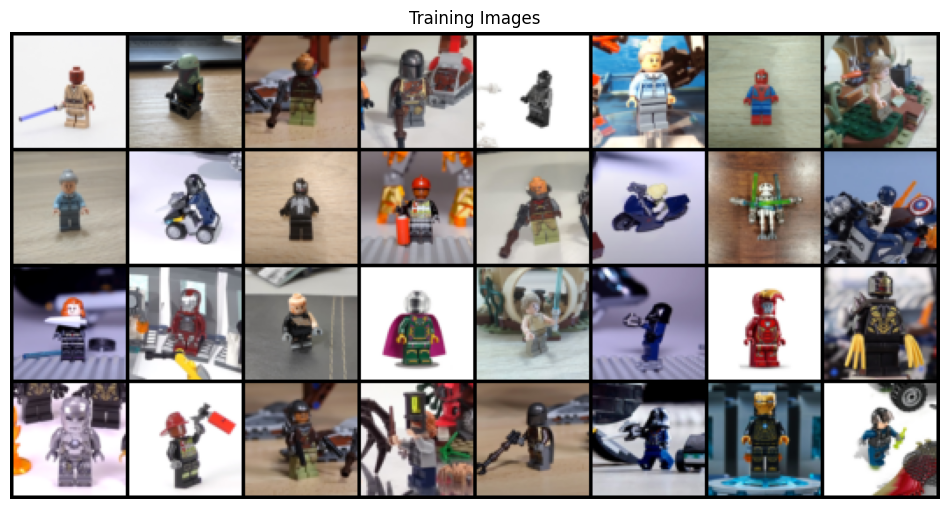

In [ ]:
dataset = datasets.ImageFolder(root=dataroot,
                               transform=transforms.Compose([
                                   transforms.Resize(IMAGE_SIZE),
                                   transforms.CenterCrop(IMAGE_SIZE),
                                   transforms.ToTensor(),
                                   transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                               ]))

dataloader = torch.utils.data.DataLoader(dataset, batch_size=BATCH_SIZE,
                                         shuffle=True)

real_batch = next(iter(dataloader))
plt.figure(figsize=(12, 12))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(), (1, 2, 0)))

Inicijalizacija težina generatora (netG) i diskriminatora (netD) u DCGAN mreži.

In [ ]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

Definisanje generatora u DCGAN mreži. Generator je odgovoran za generisanje novih slika na temelju latentnog prostora ulaznog šuma.

In [ ]:
class Generator(nn.Module):
    def __init__(self, latent_dim, image_size):
        super().__init__()

        self.main = nn.Sequential(

            nn.ConvTranspose2d(in_channels=latent_dim,
                               out_channels=image_size*8,
                               kernel_size=4,
                               stride=1,
                               padding=0,
                               bias=False),
            nn.BatchNorm2d(image_size*8),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(in_channels=image_size*8,
                               out_channels=image_size*4,
                               kernel_size=4,
                               stride=2,
                               padding=1,
                               bias=False),
            nn.BatchNorm2d(image_size*4),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(in_channels=image_size*4,
                               out_channels=image_size*2,
                               kernel_size=4,
                               stride=2,
                               padding=1,
                               bias=False),
            nn.BatchNorm2d(image_size*2),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(in_channels=image_size*2,
                               out_channels=image_size,
                               kernel_size=4,
                               stride=2,
                               padding=1,
                               bias=False),
            nn.BatchNorm2d(image_size),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(in_channels=image_size,
                               out_channels=3,
                               kernel_size=4,
                               stride=2,
                               padding=1,
                               bias=False),

            nn.Tanh(),
        )

    def forward(self, x):
        return self.main(x)

G = Generator(LATENT_DIM, IMAGE_SIZE).to(device)
G.apply(weights_init)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

Definisanje diskriminatora u DCGAN mreži. Diskriminator je odgovoran za klasifikaciju slika kao stvarnih ili generisanih.

In [ ]:
class Discriminator(nn.Module):
    def __init__(self, image_size):
        super().__init__()

        self.main = nn.Sequential(

            nn.Conv2d(in_channels=3,
                      out_channels=image_size,
                      kernel_size=4,
                      stride=2,
                      padding=1,
                      bias=False),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(in_channels=image_size,
                      out_channels=image_size*2,
                      kernel_size=4,
                      stride=2,
                      padding=1,
                      bias=False),
            nn.BatchNorm2d(image_size*2),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(in_channels=image_size*2,
                      out_channels=image_size*4,
                      kernel_size=4,
                      stride=2,
                      padding=1,
                      bias=False),
            nn.BatchNorm2d(image_size*4),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(in_channels=image_size*4,
                      out_channels=image_size*8,
                      kernel_size=4,
                      stride=2,
                      padding=1,
                      bias=False),
            nn.BatchNorm2d(image_size*8),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(in_channels=image_size*8,
                      out_channels=1,
                      kernel_size=4,
                      stride=1,
                      padding=0,
                      bias=False),

            nn.Sigmoid(),
        )

    def forward(self, x):
        return self.main(x).view(-1, 1).squeeze(1)


D = Discriminator(IMAGE_SIZE).to(device)
D.apply(weights_init)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)

Definisanje kriterijuma gubitka (criterion) i optimizatori (G_optimizer i D_optimizer) za trening DCGAN-a.

In [ ]:
criterion = nn.BCELoss()

G_optimizer = optim.Adam(G.parameters(), lr=0.0002, betas=(0.5, 0.999))
D_optimizer = optim.Adam(D.parameters(), lr=0.0002, betas=(0.5, 0.999))

#labels
real_labels = torch.ones(BATCH_SIZE,).to(device)
fake_labels = torch.zeros(BATCH_SIZE,).to(device)

def epoch_time(start_time, end_time):
    elapsed_time = end_time - start_time
    elapsed_mins = int(elapsed_time / 60)
    elapsed_secs = int(elapsed_time - (elapsed_mins * 60))
    return elapsed_mins, elapsed_secs

Definisanje klase InceptionV3 koja predstavlja unapred obučenu InceptionV3 neuronsku mrežu koja generiše vektore karakteristika.

In [ ]:
class InceptionV3(nn.Module):
    """Pretrained InceptionV3 network returning feature maps"""

    # Index of default block of inception to return,
    # corresponds to output of final average pooling
    DEFAULT_BLOCK_INDEX = 3

    # Maps feature dimensionality to their output blocks indices
    BLOCK_INDEX_BY_DIM = {
        64: 0,   # First max pooling features
        192: 1,  # Second max pooling featurs
        768: 2,  # Pre-aux classifier features
        2048: 3  # Final average pooling features
    }

    def __init__(self,
                 output_blocks=[DEFAULT_BLOCK_INDEX],
                 resize_input=True,
                 normalize_input=True,
                 requires_grad=False):

        super(InceptionV3, self).__init__()

        self.resize_input = resize_input
        self.normalize_input = normalize_input
        self.output_blocks = sorted(output_blocks)
        self.last_needed_block = max(output_blocks)

        assert self.last_needed_block <= 3, \
            'Last possible output block index is 3'

        self.blocks = nn.ModuleList()


        inception = models.inception_v3(pretrained=True)

        # Block 0: input to maxpool1
        block0 = [
            inception.Conv2d_1a_3x3,
            inception.Conv2d_2a_3x3,
            inception.Conv2d_2b_3x3,
            nn.MaxPool2d(kernel_size=3, stride=2)
        ]
        self.blocks.append(nn.Sequential(*block0))

        # Block 1: maxpool1 to maxpool2
        if self.last_needed_block >= 1:
            block1 = [
                inception.Conv2d_3b_1x1,
                inception.Conv2d_4a_3x3,
                nn.MaxPool2d(kernel_size=3, stride=2)
            ]
            self.blocks.append(nn.Sequential(*block1))

        # Block 2: maxpool2 to aux classifier
        if self.last_needed_block >= 2:
            block2 = [
                inception.Mixed_5b,
                inception.Mixed_5c,
                inception.Mixed_5d,
                inception.Mixed_6a,
                inception.Mixed_6b,
                inception.Mixed_6c,
                inception.Mixed_6d,
                inception.Mixed_6e,
            ]
            self.blocks.append(nn.Sequential(*block2))

        # Block 3: aux classifier to final avgpool
        if self.last_needed_block >= 3:
            block3 = [
                inception.Mixed_7a,
                inception.Mixed_7b,
                inception.Mixed_7c,
                nn.AdaptiveAvgPool2d(output_size=(1, 1))
            ]
            self.blocks.append(nn.Sequential(*block3))

        for param in self.parameters():
            param.requires_grad = requires_grad

    def forward(self, inp):
        """Get Inception feature maps
        Parameters
        ----------
        inp : torch.autograd.Variable
            Input tensor of shape Bx3xHxW. Values are expected to be in
            range (0, 1)
        Returns
        -------
        List of torch.autograd.Variable, corresponding to the selected output
        block, sorted ascending by index
        """
        outp = []
        x = inp

        if self.resize_input:
            x = F.interpolate(x,
                              size=(299, 299),
                              mode='bilinear',
                              align_corners=False)

        if self.normalize_input:
            x = 2 * x - 1  # Scale from range (0, 1) to range (-1, 1)

        for idx, block in enumerate(self.blocks):
            x = block(x)
            if idx in self.output_blocks:
                outp.append(x)

            if idx == self.last_needed_block:
                break

        return outp

block_idx = InceptionV3.BLOCK_INDEX_BY_DIM[2048]
model = InceptionV3([block_idx])
model.cpu()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/inception_v3_google-0cc3c7bd.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-0cc3c7bd.pth
100%|██████████| 104M/104M [00:01<00:00, 87.0MB/s]


InceptionV3(
  (blocks): ModuleList(
    (0): Sequential(
      (0): BasicConv2d(
        (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
        (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicConv2d(
        (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
        (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      )
      (2): BasicConv2d(
        (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      )
      (3): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
    (1): Sequential(
      (0): BasicConv2d(
        (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      

 Tri funkcije koje se koriste za izračunavanje statistika aktivacija i Frechet udaljenosti između dva skupa slika.

In [ ]:
def calculate_activation_statistics(images,model,batch_size=128, dims=2048,
                    cpu=False):
    model.eval()
    act=np.empty((len(images), dims))

    if cpu:
        batch=images.cpu()
    else:
        batch=images
    pred = model(batch)[0]

        # If model output is not scalar, apply global spatial average pooling.
        # This happens if you choose a dimensionality not equal 2048.
    if pred.size(2) != 1 or pred.size(3) != 1:
        pred = adaptive_avg_pool2d(pred, output_size=(1, 1))

    act= pred.cpu().data.numpy().reshape(pred.size(0), -1)

    mu = np.mean(act, axis=0)
    sigma = np.cov(act, rowvar=False)
    return mu, sigma

def calculate_frechet_distance(mu1, sigma1, mu2, sigma2, eps=1e-6):
    """Numpy implementation of the Frechet Distance.
    The Frechet distance between two multivariate Gaussians X_1 ~ N(mu_1, C_1)
    and X_2 ~ N(mu_2, C_2) is
            d^2 = ||mu_1 - mu_2||^2 + Tr(C_1 + C_2 - 2*sqrt(C_1*C_2)).
    """

    mu1 = np.atleast_1d(mu1)
    mu2 = np.atleast_1d(mu2)

    sigma1 = np.atleast_2d(sigma1)
    sigma2 = np.atleast_2d(sigma2)

    assert mu1.shape == mu2.shape, \
        'Training and test mean vectors have different lengths'
    assert sigma1.shape == sigma2.shape, \
        'Training and test covariances have different dimensions'

    diff = mu1 - mu2


    covmean, _ = linalg.sqrtm(sigma1.dot(sigma2), disp=False)
    if not np.isfinite(covmean).all():
        msg = ('fid calculation produces singular product; '
               'adding %s to diagonal of cov estimates') % eps
        print(msg)
        offset = np.eye(sigma1.shape[0]) * eps
        covmean = linalg.sqrtm((sigma1 + offset).dot(sigma2 + offset))


    if np.iscomplexobj(covmean):
        if not np.allclose(np.diagonal(covmean).imag, 0, atol=1e-3):
            m = np.max(np.abs(covmean.imag))
            raise ValueError('Imaginary component {}'.format(m))
        covmean = covmean.real

    tr_covmean = np.trace(covmean)

    return (diff.dot(diff) + np.trace(sigma1) +
            np.trace(sigma2) - 2 * tr_covmean)

def calculate_fretchet(images_real,images_fake,model):
     mu_1,std_1=calculate_activation_statistics(images_real,model,cpu=True)
     mu_2,std_2=calculate_activation_statistics(images_fake,model,cpu=True)

     """get fretched distance"""
     fid_value = calculate_frechet_distance(mu_1, std_1, mu_2, std_2)
     return fid_value

Kreiranje novog foldera gde će biti smeštene slike nakon treninga.

In [ ]:
output_path = '/content/drive/MyDrive/LEGO_GAN/output'

# Provera da li folder već postoji
if not os.path.exists(output_path):
    # Kreiranje novog foldera
    os.makedirs(output_path)
    print(f'Folder {output_path} je uspešno kreiran.')
else:
    print(f'Folder {output_path} već postoji.')

Folder /content/drive/MyDrive/LEGO_GAN/output je uspešno kreiran.


Trening petlja generativnog suparničkog modela (GAN).

| Epoch: 000 | D_error: 0.335 | G_error: 8.232 | FID_score: 494.7543 | Time: 2m 48s


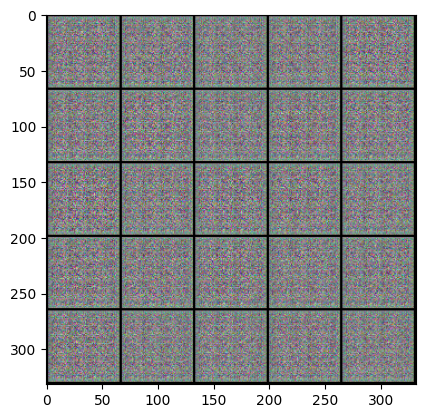

| Epoch: 1 |
| Epoch: 2 |
| Epoch: 3 |
| Epoch: 4 |
| Epoch: 005 | D_error: 1.575 | G_error: 3.035 | FID_score: 392.0717 | Time: 1m 7s


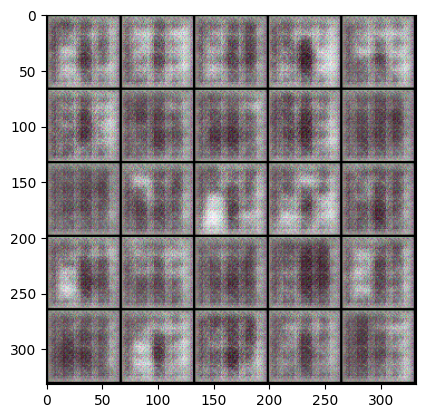

| Epoch: 6 |
| Epoch: 7 |
| Epoch: 8 |
| Epoch: 9 |
| Epoch: 010 | D_error: 0.523 | G_error: 6.899 | FID_score: 431.2648 | Time: 1m 5s


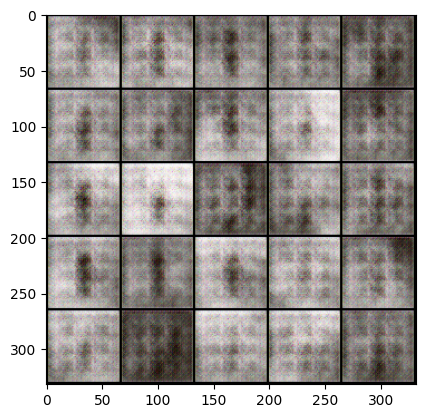

| Epoch: 11 |
| Epoch: 12 |
| Epoch: 13 |
| Epoch: 14 |
| Epoch: 015 | D_error: 0.420 | G_error: 6.088 | FID_score: 406.4476 | Time: 1m 5s


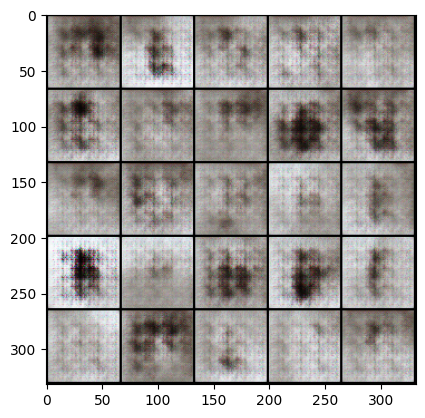

| Epoch: 16 |
| Epoch: 17 |
| Epoch: 18 |
| Epoch: 19 |
| Epoch: 020 | D_error: 0.361 | G_error: 5.618 | FID_score: 409.4426 | Time: 1m 3s


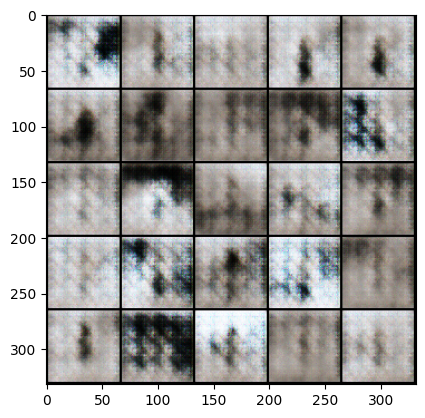

| Epoch: 21 |
| Epoch: 22 |
| Epoch: 23 |
| Epoch: 24 |
| Epoch: 025 | D_error: 0.161 | G_error: 4.234 | FID_score: 426.0888 | Time: 1m 5s


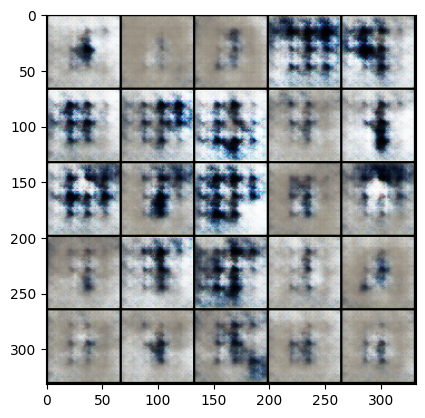

| Epoch: 26 |
| Epoch: 27 |
| Epoch: 28 |
| Epoch: 29 |
| Epoch: 030 | D_error: 0.965 | G_error: 11.133 | FID_score: 411.4422 | Time: 1m 5s


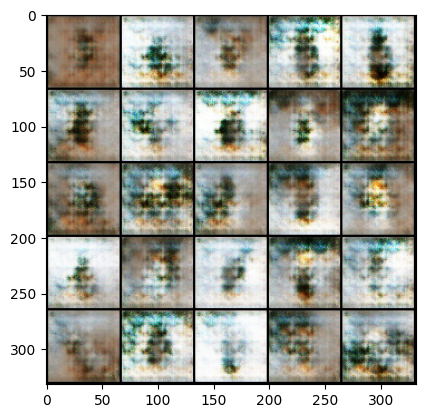

| Epoch: 31 |
| Epoch: 32 |
| Epoch: 33 |
| Epoch: 34 |
| Epoch: 035 | D_error: 0.292 | G_error: 5.715 | FID_score: 421.1260 | Time: 1m 10s


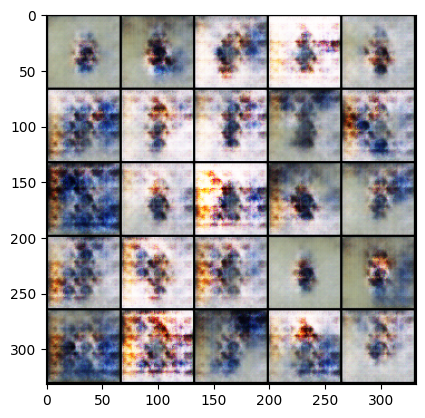

| Epoch: 36 |
| Epoch: 37 |
| Epoch: 38 |
| Epoch: 39 |
| Epoch: 040 | D_error: 0.262 | G_error: 4.578 | FID_score: 417.6866 | Time: 1m 6s


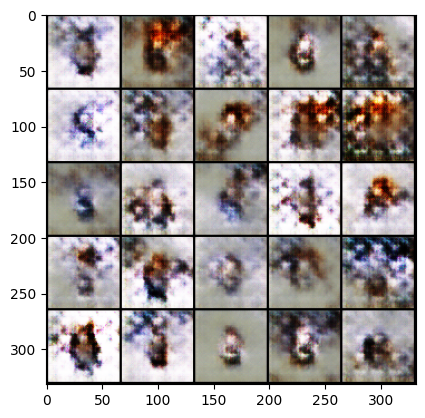

| Epoch: 41 |
| Epoch: 42 |
| Epoch: 43 |
| Epoch: 44 |
| Epoch: 045 | D_error: 0.244 | G_error: 5.936 | FID_score: 435.0655 | Time: 1m 6s


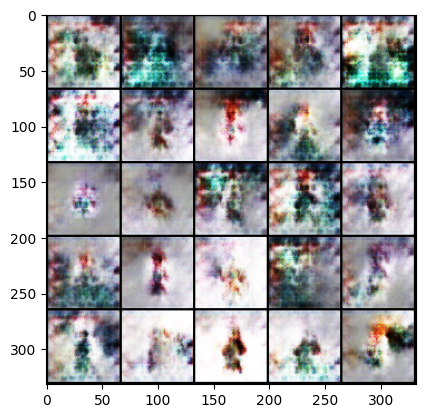

| Epoch: 46 |
| Epoch: 47 |
| Epoch: 48 |
| Epoch: 49 |
| Epoch: 050 | D_error: 0.306 | G_error: 3.968 | FID_score: 370.9945 | Time: 1m 5s


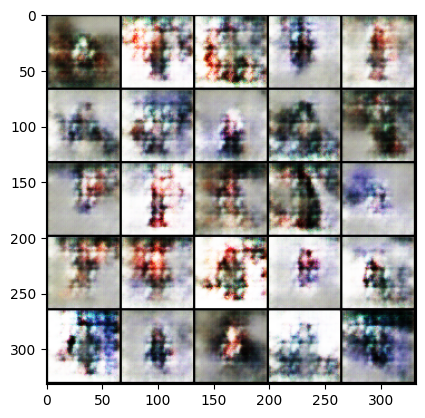

| Epoch: 51 |
| Epoch: 52 |
| Epoch: 53 |
| Epoch: 54 |
| Epoch: 055 | D_error: 0.317 | G_error: 4.285 | FID_score: 434.9569 | Time: 1m 5s


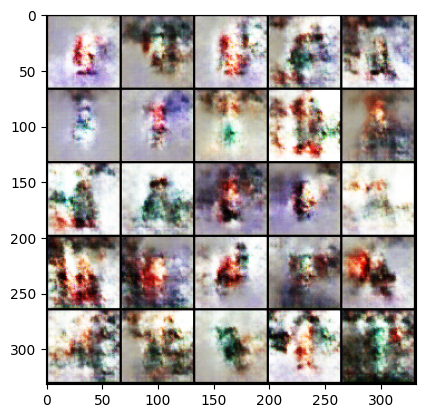

| Epoch: 56 |
| Epoch: 57 |
| Epoch: 58 |
| Epoch: 59 |
| Epoch: 060 | D_error: 0.412 | G_error: 3.538 | FID_score: 390.7325 | Time: 1m 3s


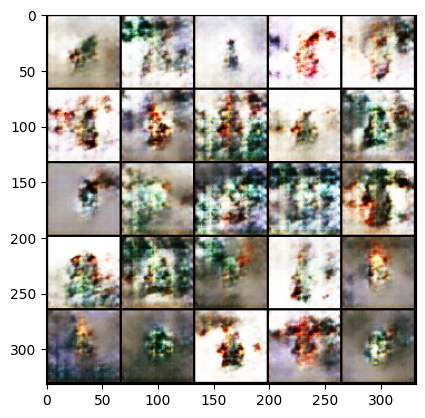

| Epoch: 61 |
| Epoch: 62 |
| Epoch: 63 |
| Epoch: 64 |
| Epoch: 065 | D_error: 0.190 | G_error: 5.056 | FID_score: 359.9296 | Time: 1m 5s


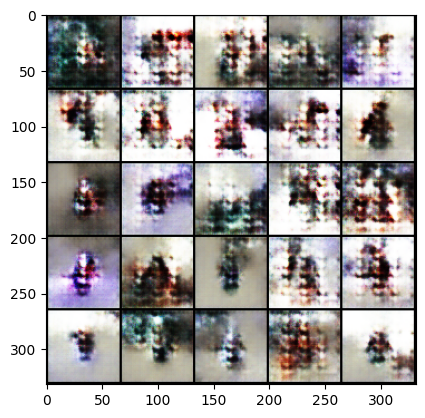

| Epoch: 66 |
| Epoch: 67 |
| Epoch: 68 |
| Epoch: 69 |
| Epoch: 070 | D_error: 0.083 | G_error: 5.056 | FID_score: 367.7276 | Time: 1m 4s


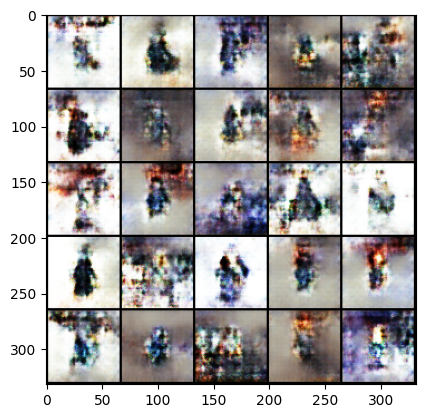

| Epoch: 71 |
| Epoch: 72 |
| Epoch: 73 |
| Epoch: 74 |
| Epoch: 075 | D_error: 0.101 | G_error: 3.545 | FID_score: 389.7795 | Time: 1m 5s


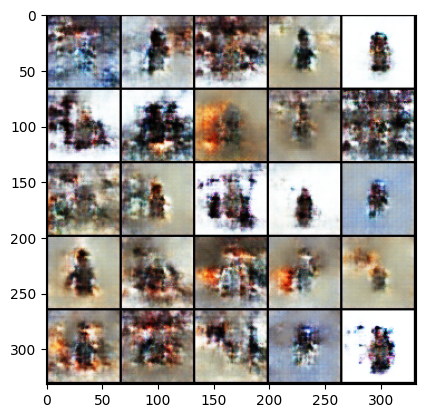

| Epoch: 76 |
| Epoch: 77 |
| Epoch: 78 |
| Epoch: 79 |
| Epoch: 080 | D_error: 0.176 | G_error: 6.462 | FID_score: 355.7726 | Time: 1m 6s


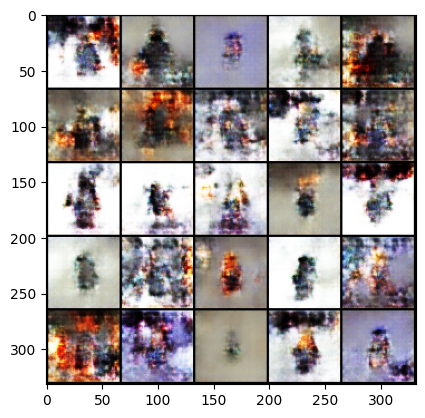

| Epoch: 81 |
| Epoch: 82 |
| Epoch: 83 |
| Epoch: 84 |
| Epoch: 085 | D_error: 0.219 | G_error: 3.637 | FID_score: 387.6039 | Time: 1m 5s


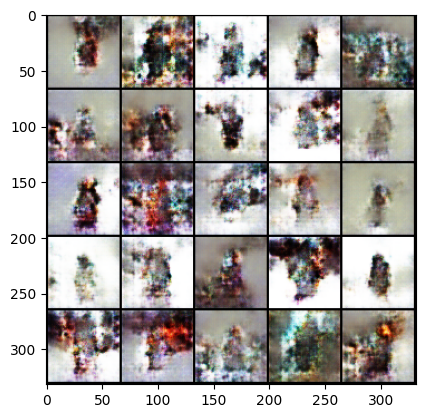

| Epoch: 86 |
| Epoch: 87 |
| Epoch: 88 |
| Epoch: 89 |
| Epoch: 090 | D_error: 0.098 | G_error: 5.227 | FID_score: 379.3436 | Time: 1m 5s


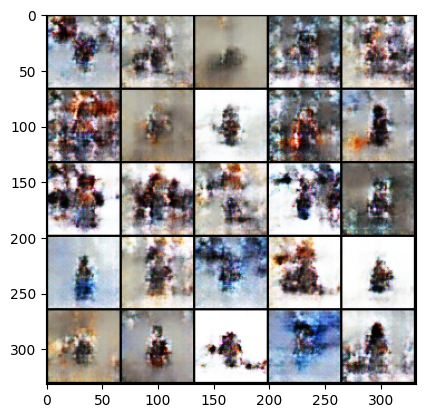

| Epoch: 91 |
| Epoch: 92 |
| Epoch: 93 |
| Epoch: 94 |
| Epoch: 095 | D_error: 0.072 | G_error: 6.090 | FID_score: 373.6009 | Time: 1m 5s


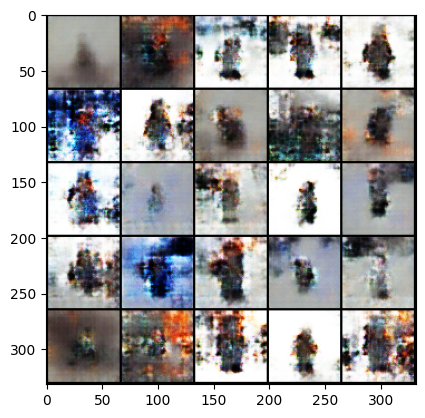

| Epoch: 96 |
| Epoch: 97 |
| Epoch: 98 |
| Epoch: 99 |
| Epoch: 100 | D_error: 0.535 | G_error: 5.706 | FID_score: 394.4795 | Time: 1m 4s


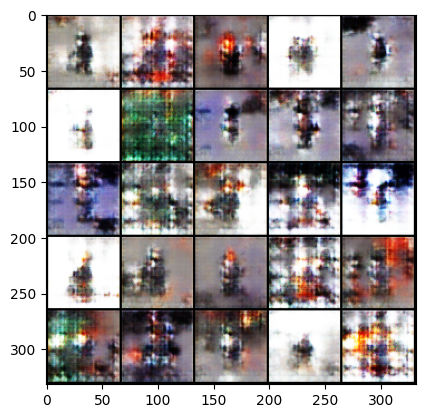

| Epoch: 101 |
| Epoch: 102 |
| Epoch: 103 |
| Epoch: 104 |
| Epoch: 105 | D_error: 0.107 | G_error: 5.733 | FID_score: 418.7532 | Time: 1m 5s


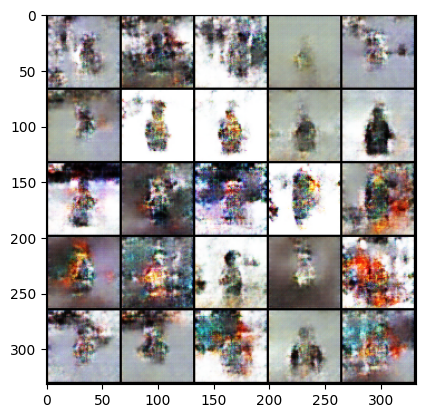

| Epoch: 106 |
| Epoch: 107 |
| Epoch: 108 |
| Epoch: 109 |
| Epoch: 110 | D_error: 0.065 | G_error: 5.829 | FID_score: 363.7861 | Time: 1m 3s


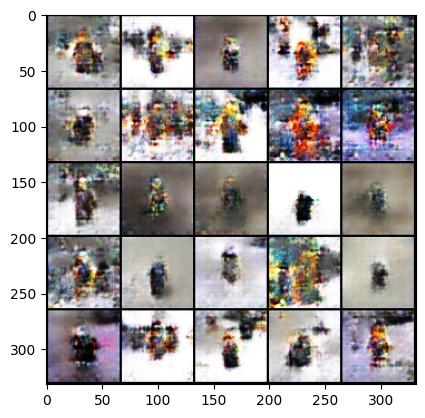

| Epoch: 111 |
| Epoch: 112 |
| Epoch: 113 |
| Epoch: 114 |
| Epoch: 115 | D_error: 0.099 | G_error: 4.252 | FID_score: 349.2699 | Time: 1m 5s


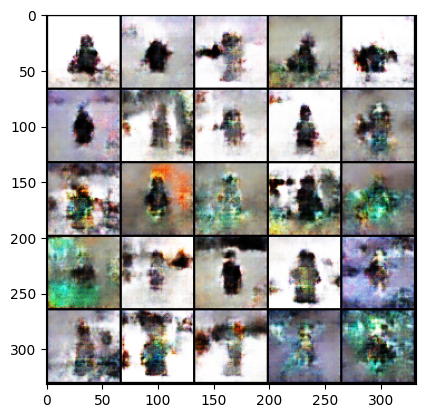

| Epoch: 116 |
| Epoch: 117 |
| Epoch: 118 |
| Epoch: 119 |
| Epoch: 120 | D_error: 0.074 | G_error: 5.728 | FID_score: 365.8313 | Time: 1m 5s


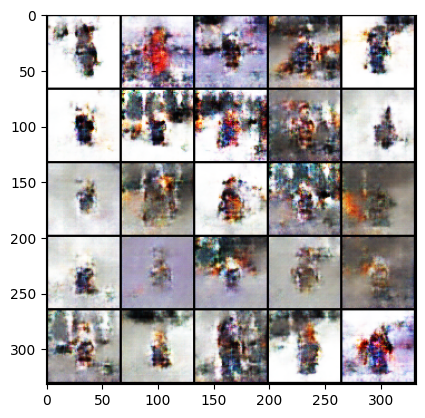

| Epoch: 121 |
| Epoch: 122 |
| Epoch: 123 |
| Epoch: 124 |
| Epoch: 125 | D_error: 0.088 | G_error: 5.877 | FID_score: 350.9986 | Time: 1m 3s


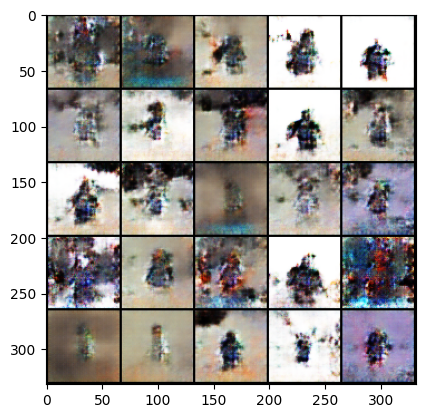

| Epoch: 126 |
| Epoch: 127 |
| Epoch: 128 |
| Epoch: 129 |
| Epoch: 130 | D_error: 0.049 | G_error: 6.627 | FID_score: 392.5947 | Time: 1m 5s


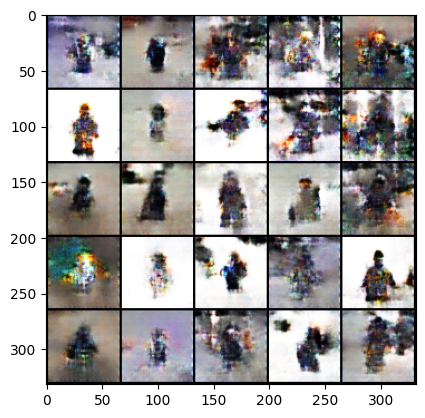

| Epoch: 131 |
| Epoch: 132 |
| Epoch: 133 |
| Epoch: 134 |
| Epoch: 135 | D_error: 0.536 | G_error: 5.202 | FID_score: 381.8353 | Time: 1m 5s


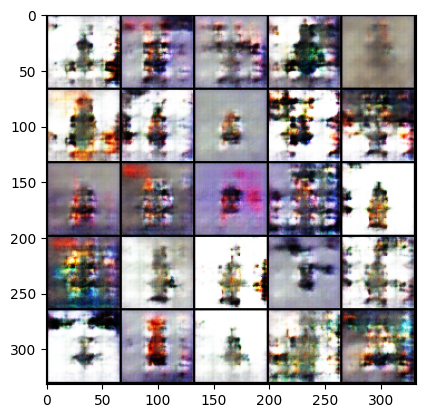

| Epoch: 136 |
| Epoch: 137 |
| Epoch: 138 |
| Epoch: 139 |
| Epoch: 140 | D_error: 0.080 | G_error: 5.180 | FID_score: 384.9341 | Time: 1m 5s


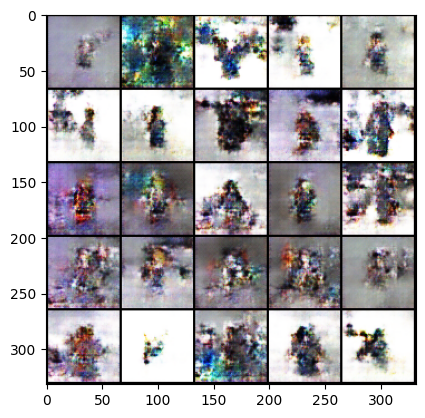

| Epoch: 141 |
| Epoch: 142 |
| Epoch: 143 |
| Epoch: 144 |
| Epoch: 145 | D_error: 0.076 | G_error: 6.677 | FID_score: 390.1265 | Time: 1m 5s


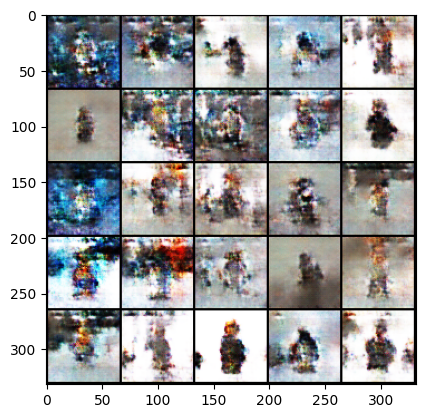

| Epoch: 146 |
| Epoch: 147 |
| Epoch: 148 |
| Epoch: 149 |
| Epoch: 150 | D_error: 0.149 | G_error: 3.365 | FID_score: 387.0692 | Time: 1m 16s


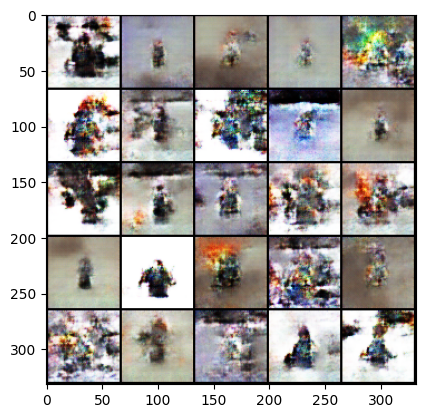

In [ ]:
G_losses = []
D_losses = []
for epoch in range(0, N_EPOCHS+1):

    start_time = time.time()
    if epoch % 5 != 0:
        print('| Epoch: '+str(epoch)+' |')

    for _ in range(len(dataloader)):


        D.zero_grad()


        x, _ = next(iter(dataloader))


        z = torch.randn(x.shape[0], LATENT_DIM, 1, 1)

        with torch.no_grad():
            generated_images = G(z)


        pred_real = D(x)


        D_error_real = criterion(pred_real, real_labels)


        pred_fake = D(generated_images.detach())


        D_error_fake = criterion(pred_fake, fake_labels)


        D_error = D_error_real + D_error_fake


        D_error.backward()


        D_optimizer.step()


        G.zero_grad()


        z = torch.randn(x.shape[0], LATENT_DIM, 1, 1)


        generated_images = G(z)


        pred_fake = D(generated_images)


        G_error = criterion(pred_fake, real_labels)


        G_error.backward()


        G_optimizer.step()


    G_losses.append(G_error.item())
    D_losses.append(D_error.item())
    fretchet_dist = calculate_fretchet(x, generated_images, model.to('cpu'))

    end_time = time.time()

    epoch_mins, epoch_secs = epoch_time(start_time, end_time)

    if (epoch % 5) == 0:


        z = torch.randn(5*5, LATENT_DIM, 1, 1)


        with torch.no_grad():
            generated_images = G(z)

        print(f'| Epoch: {epoch:03} | D_error: {D_error.item():.03f} | G_error: {G_error.item():.03f} | FID_score: {fretchet_dist:.04f} | Time: {epoch_mins}m {epoch_secs}s')


        torchvision.utils.save_image(generated_images,
                                     f'/content/drive/MyDrive/LEGO_GAN/output/epoch{epoch:03}.png',
                                     nrow=5,
                                     normalize=True)

        img = plt.imread(f'/content/drive/MyDrive/LEGO_GAN/output/epoch{epoch:03}.png')
        plt.imshow(img)
        plt.show()

Grafik koji predstavlja gubitak genratora i diskriminatora tokom treninga, gde jedna labela predstavlja iteracije, dok druga predstavlja gubitak

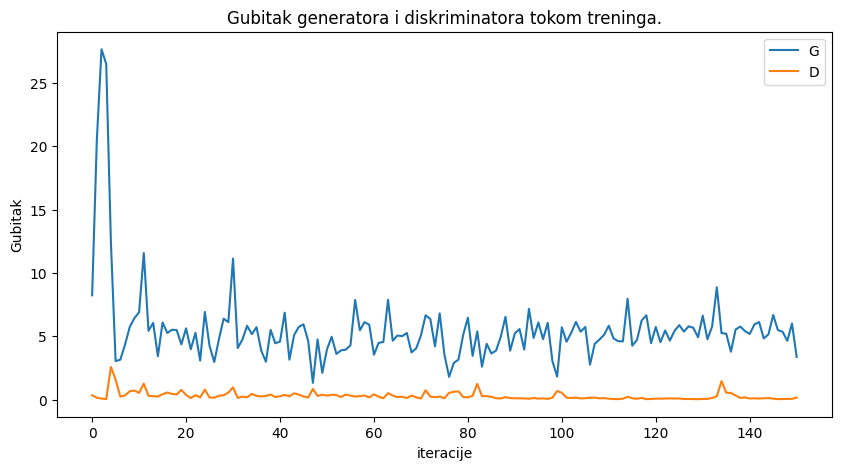

In [ ]:
plt.figure(figsize=(10,5))
plt.title("Gubitak generatora i diskriminatora tokom treninga.")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iteracije")
plt.ylabel("Gubitak")
plt.legend()
plt.show()